### MD004 ENTREGA4 REGRESIÓN LINEAL 

### <font color='#3d59c6'> PARTE I </font>

#### Tienes un compañero de MD004 que afirma que puede predecir la nota final de la asignatura en función del tiempo que pasa jugando a videojuegos. Decides ponerlo a prueba y le preguntas por la ecuación de regresión que usaría para hacer la predicción. Te responde inmediatamente que un modelo de regresión lineal simple. Ahora, ¿cómo comprobarías si realmente comprende el modelo poniendo a prueba su conocimiento sobre regresión lineal simple?

Lo primero por lo que le preguntaria seria por la forma de la equacion de regresion lineal, y en caso de que me diera la respuesta correcta seguiria preguntandole por que variable usaria como variable dependiente e independiente. 

Siendo la ecuacion de regresion lineal con una sola variable predictora la siguiente: Y = mx + n le preguntaria por el significado de los coeficientes m y n, m siendo el cambio de Y por cada unidad de cambio de X y n siendo la ordenada en el origen.

Una vez me ha respondido esto se que tiene un conocimiento báscio sobre la regresión lineal simple, pero para asegurarme si realmente lo comprende a la perfección le preguntaria por las asunciones fundamentales de la regresion lineal simple, es decir, por la linealidad, independencia de errores, homocedasticidad y normalidad de los residuos. Le pediria que me los explicara, me dijera la razón de su importancia para la regresión y como los relacionaria con el caso que propone.

#### Finalmente desafías a tu compañero a mejorar su modelo y le pides que considere agregar otra variable predictora: "la cantidad de horas dedicadas al estudio". ¿qué argumentos en contra o a favor te podría dar? ¿cómo podrías evaluar si la nueva variable realmente mejora la capacidad predictiva del modelo?

Hay tanto argumentos a favor como en contra, a favor podria argumentar que un parametro mas en la regresion, significaria una mayor precisión en la predicción, ya que es muy probable que la cantidad de horas dedicadas al estudio tenga una correlación fuerte con la nota final. Tambien aportaria un mayor grado de explicatoriedad del resultado final ya que dispondriamos de dos coeficientes que ayudarian a entender la predicción.

En contra, podria argumentar que la variable nueva puede estar correlacionada con la variable de horas de juego, implicando un problema de colinealidad provocando el efecto contrario al deseado y empeorando la precisión de la predicción. Otro argumento en contra, sería que agregar otra variable al modelo regresor, haría el modelo más complejo pudiendo afectar negativamente a la predicción.

En cuánto a cómo evaluar si realmente mejora la capacidad predictiva, podríamos realizar un analisis de correlación entre ambas variables predictoras para saber si habría un problema de colinealidad. Aunque la forma más efectiva de asegurarnos, seria usando una métrica de error como el Root Mean Squared Error en ambos modelos y comparándolos para llegar a una conclusión.

### <font color='#3d59c6'> PARTE II </font>

Se dispone de un dataset que contiene en formato csv datos de la población de Estados Unidos con el objetivo de generar un modelo de regresión lineal simple para predecir las tasas de mortalidad por cáncer (target_deathrate) en los condados de los Estados Unidos

###### Data: 
202311_04_cancer_reg.csv

###### Se pide:

1. Exploración de los datos: análisis descriptivos de los datos y graficación comentando los resultados obtenidos
- análisis descriptivo de la variable objetivo (métricas+gráficos) comentando los resultados
- análisis descriptivo de las variables explicativas (métricas+gráficos) comentando los resultados
- análisis bivariante entre la variable objetivo vs variable explicativa, escoged las 2 variables que a priori se observe que mejor ajustarían en un modelo de regresión lineal y justificad el porqué

In [109]:
library(ggplot2)
#install.packages('gridExtra')
library(gridExtra)
#library(tidyverse)
library(caret)
#library(lmtest)
#library(broom)

In [9]:
data <- read.csv(file='202311_04_cancer_reg.csv', header=TRUE, sep=',', dec='.')

La variable objetivo sera target_deathrate ya que es lo que el enunciado nos dice que queremos predecir.

In [17]:
mean(data$target_deathrate)
median(data$target_deathrate)
sd(data$target_deathrate)
min(data$target_deathrate)
max(data$target_deathrate)

[1] 178.6641

[1] 178.1

[1] 27.75151

[1] 59.7

[1] 362.8

Aqui podemos ver algunas de las metricas de la variable objetivo, como podemos apreciar, la media y mediana son muy parecidas lo que puede indicarnos que estemos delante de una variable con una distribucion normal. Además de esto, también podemos ver una desviación no demasiado grande y los valores mínimo y máximo que nos indican el rango comprimido en esta variable.

Ahora voy a generar un histograma y un boxplot para ver si se confirman mis sospechas sobre la distribución que sigue esta variable.

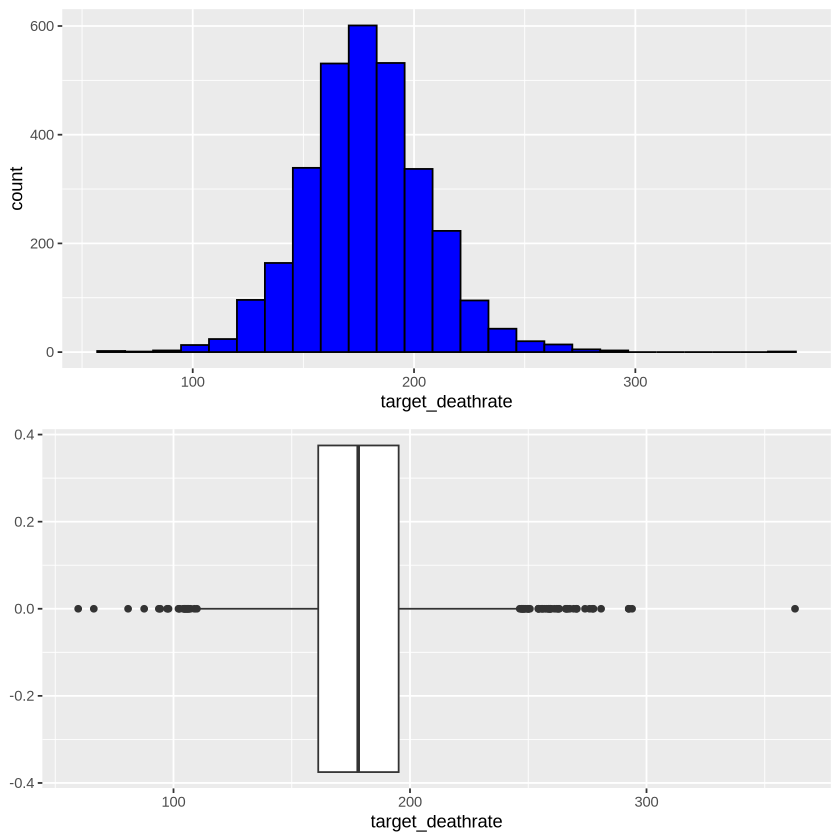

In [67]:
a = ggplot(data, aes(x=target_deathrate)) + geom_histogram(bins=25,color="black", fill="blue")
b = ggplot(data, aes(x=target_deathrate)) + geom_boxplot()
grid.arrange(a,b)

Gracias al histograma sabemos que en efecto, estamos trabajando con una distribución normal con la media de la distribución en 178,6.

En el boxplot podemos apreciar como la gran mayoria de los datos de la distribución se comprimen en un pequeño rango, teniendo algunos valores mas extremos que podrian llegar a tratarse de outliers.

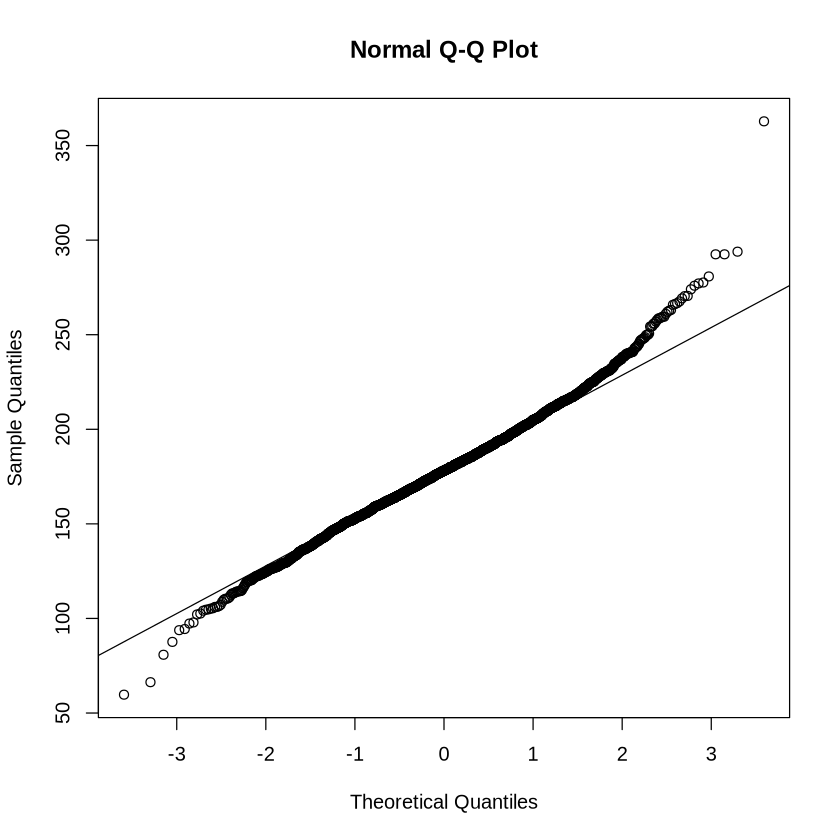

In [13]:
qqnorm(data$target_deathrate)
qqline(data$target_deathrate)

Con este qqplot me aseguro de que la variable sigue una distribución normal.

Ahora me dispongo a realizar en análisis de las variables explicativas.

                  Columna Correlacion
1        target_deathrate   1.0000000
2           incidencerate   0.4287871
3               medincome  -0.4267843
4          povertypercent   0.4250833
5            pcths25_over   0.4038419
6       pctbachdeg25_over  -0.4825943
7      pctemployed16_over  -0.4120458
8    pctunemployed16_over   0.3737501
9      pctprivatecoverage  -0.3854198
10      pctpubliccoverage   0.4021413
11 pctpubliccoveragealone   0.4480871


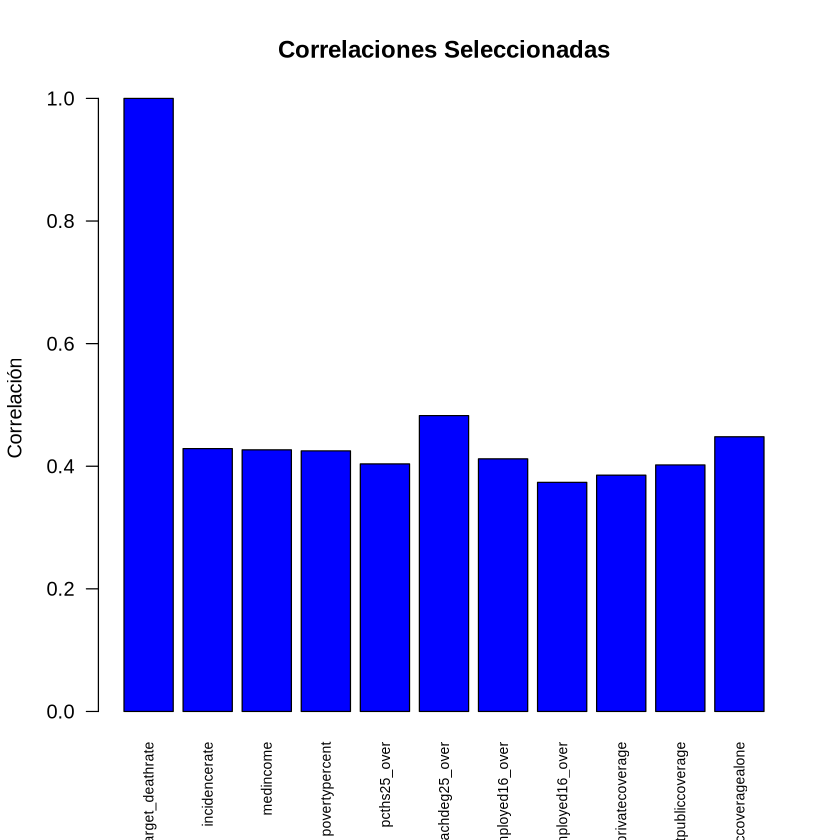

In [65]:
sub_data <- subset(data, select = -c(geography, binnedinc, pctsomecol18_24, pctprivatecoveragealone))
#pctsomecol18_24 i pctprivatecoveragealone te molts NA, la resta son no numerics.
sub_data <- sub_data[complete.cases(sub_data),]

#correlation_matrix <- cor(sub_data)
#heatmap(correlation_matrix, symm = FALSE, margins = c(5, 5))

correlation_matrix <- cor(sub_data, sub_data$target_deathrate)
#print(correlation_matrix)

selected_columns <- colnames(sub_data)[abs(correlation_matrix) >= 0.35]

selected_columns_info <- data.frame(
  Columna = selected_columns,
  Correlacion = (correlation_matrix[match(selected_columns, rownames(correlation_matrix))])
)

print(selected_columns_info)
barplot(abs(selected_columns_info$Correlacion), names.arg = selected_columns_info$Columna, col = "blue", main = "Correlaciones Seleccionadas", ylab = "Correlación", las = 2, cex.names = 0.7)


Lo que hago en esta última celda es una matriz de correlaciones donde busco la correlación que tiene cada variable con la variable objetivo 'target_deathrate', y después filtro todas aquellas que no llegan a un +-0,35 de valor de correlacion. Se puede ver gracias a los valores y al posterior gráfico de barras como no hay ninguna variable que destaque excepcionalmente y que no hay ninguna correlación que se pueda considerar 'fuerte' con la variable objetivo.

[1] "Medidas para la variable pctpubliccoveragealone"
[1] "La media es: 19.2400722021661"
[1] "La mediana es: 18.8"
[1] "La desviacion estandar es: 6.11304099862406"
[1] "El valor mínimo es: 2.6"
[1] "El valor máximo es: 46.6"
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
[1] "Medidas para la variable incidencerate"
[1] "La media es: 448.268585806564"
[1] "La mediana es: 453.5494221"
[1] "La desviacion estandar es: 54.5607327193297"
[1] "El valor mínimo es: 201.3"
[1] "El valor máximo es: 1206.9"
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
[1] "Medidas para la variable medincome"
[1] "La media es: 47063.2819166393"
[1] "La mediana es: 45207"
[1] "La desviacion estandar es: 12040.0908358069"
[1] "El valor mínimo es: 22640"
[1] "El valor máximo es: 125635"
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
[1] "Medidas para la variable pctbachdeg25_over"
[1] "La media es: 13.282015096816

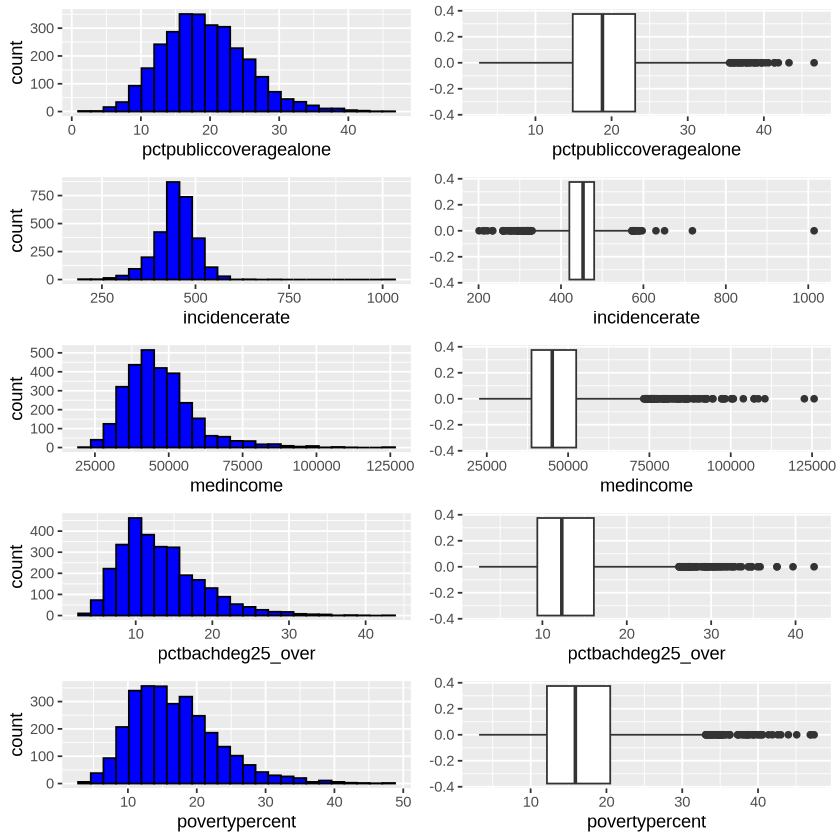

In [82]:
print("Medidas para la variable pctpubliccoveragealone")
print(paste("La media es:", mean(data$pctpubliccoveragealone)))
print(paste("La mediana es:", median(data$pctpubliccoveragealone)))
print(paste("La desviacion estandar es:", sd(data$pctpubliccoveragealone)))
print(paste("El valor mínimo es:", min(data$pctpubliccoveragealone)))
print(paste("El valor máximo es:", max(data$pctpubliccoveragealone)))
cat(rep("-", 40), "\n") 

print("Medidas para la variable incidencerate")
print(paste("La media es:", mean(data$incidencerate)))
print(paste("La mediana es:", median(data$incidencerate)))
print(paste("La desviacion estandar es:", sd(data$incidencerate)))
print(paste("El valor mínimo es:", min(data$incidencerate)))
print(paste("El valor máximo es:", max(data$incidencerate)))
cat(rep("-", 40), "\n")  

print("Medidas para la variable medincome")
print(paste("La media es:", mean(data$medincome)))
print(paste("La mediana es:", median(data$medincome)))
print(paste("La desviacion estandar es:", sd(data$medincome)))
print(paste("El valor mínimo es:", min(data$medincome)))
print(paste("El valor máximo es:", max(data$medincome)))
cat(rep("-", 40), "\n") 

print("Medidas para la variable pctbachdeg25_over")
print(paste("La media es:", mean(data$pctbachdeg25_over)))
print(paste("La mediana es:", median(data$pctbachdeg25_over)))
print(paste("La desviacion estandar es:", sd(data$pctbachdeg25_over)))
print(paste("El valor mínimo es:", min(data$pctbachdeg25_over)))
print(paste("El valor máximo es:", max(data$pctbachdeg25_over)))
cat(rep("-", 40), "\n")

print("Medidas para la variable povertypercent")
print(paste("La media es:", mean(data$povertypercent)))
print(paste("La mediana es:", median(data$povertypercent)))
print(paste("La desviacion estandar es:", sd(data$povertypercent)))
print(paste("El valor mínimo es:", min(data$povertypercent)))
print(paste("El valor máximo es:", max(data$povertypercent)))
cat(rep("-", 40), "\n") 

a1 = ggplot(sub_data, aes(x=pctpubliccoveragealone)) + geom_histogram(bins=25,color="black", fill="blue")
b1 = ggplot(sub_data, aes(x=pctpubliccoveragealone)) + geom_boxplot()

a2 = ggplot(sub_data, aes(x=incidencerate)) + geom_histogram(bins=25,color="black", fill="blue")
b2 = ggplot(sub_data, aes(x=incidencerate)) + geom_boxplot()

a3 = ggplot(sub_data, aes(x=medincome)) + geom_histogram(bins=25,color="black", fill="blue")
b3 = ggplot(sub_data, aes(x=medincome)) + geom_boxplot()

a4 = ggplot(sub_data, aes(x=pctbachdeg25_over)) + geom_histogram(bins=25,color="black", fill="blue")
b4 = ggplot(sub_data, aes(x=pctbachdeg25_over)) + geom_boxplot()

a5 = ggplot(sub_data, aes(x=povertypercent)) + geom_histogram(bins=25,color="black", fill="blue")
b5 = ggplot(sub_data, aes(x=povertypercent)) + geom_boxplot()
grid.arrange(a,b,a2,b2,a3,b3,a4,b4,a5,b5,ncol = 2)

Aqui encuentro las distintas metricas y gráficas para las posibles variables explicativas, las cuales he escogido basandome en los valores de la correlaciones anteriores. Aquí podemos ver como la variable pctpubliccoveragealone resulta bastante interesante, ya que al igual que con la variable objetivo, esta también sigue una distribucíon normal aunque tiene una desviación porcentualmente ligeramente mayor a esta. 

La otra variable en la que me voy a fijar es aquella con la correlación mas fuerte con la variable objetivo, se trata de pctbachdeg25_over. Esta variable pese a no ser tan claro como en el otro caso, también sigue algo parecido a una distribución normal. Algo interesante a observar que se puede apreciar gracias a los boxplots en todas las variables, es que parecen tener una gran cantidad de outliers lo qual podria generar una gran cantidad de ruido en el modelo de regresión.

Ahora que he decidido las 2 variables voy a usar para los modelos, me dispongo a hacer el análisis bivariante.

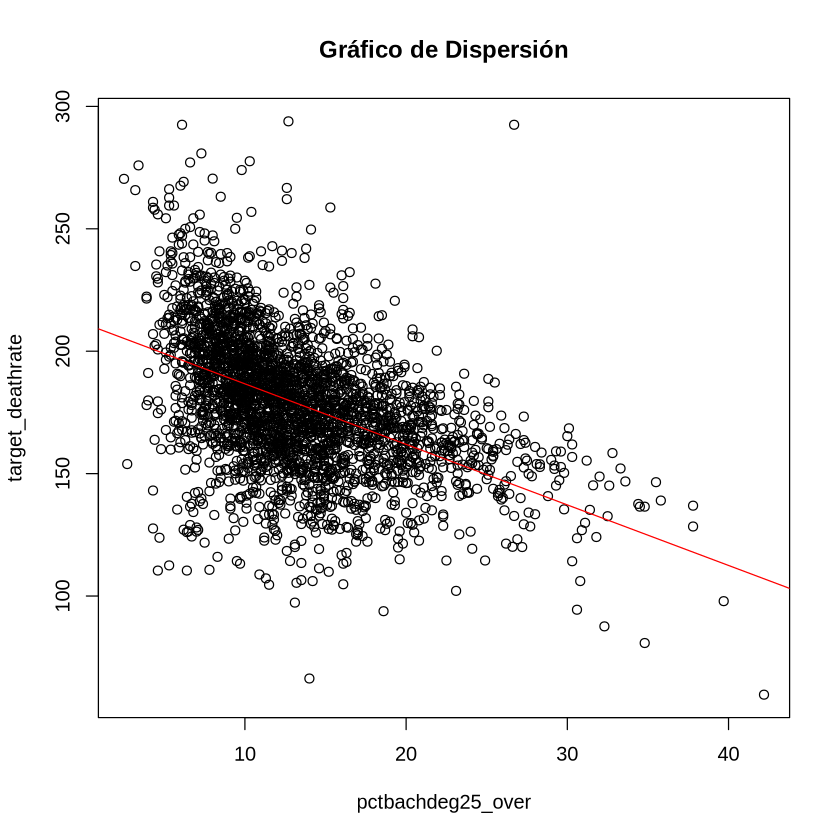

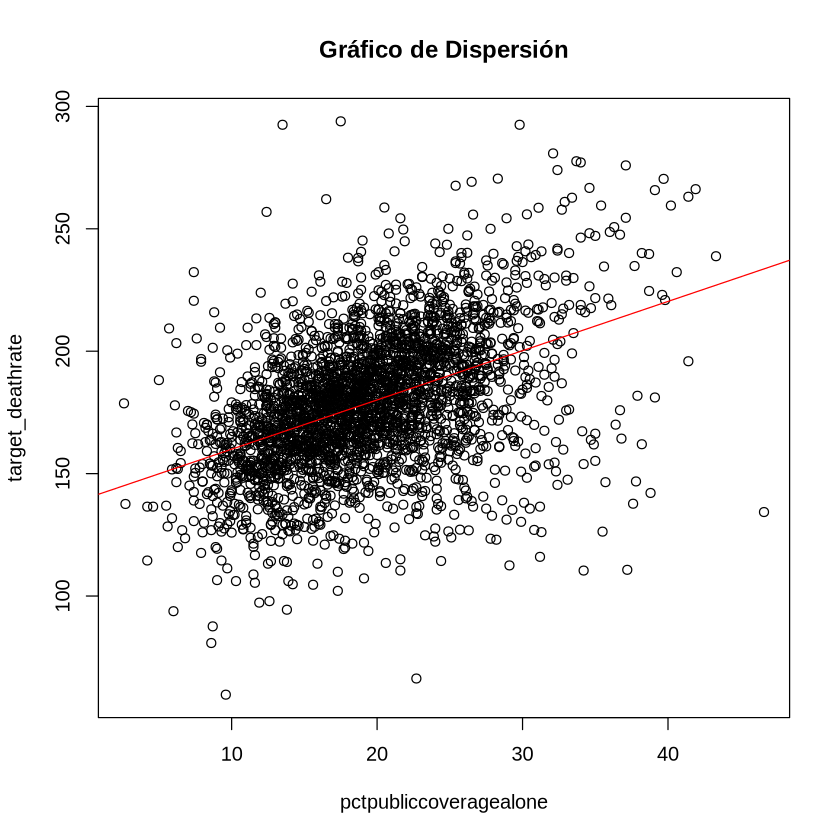

In [155]:
plot(sub_data$pctbachdeg25_over, sub_data$target_deathrate, main = "Gráfico de Dispersión", xlab = "pctbachdeg25_over", ylab = "target_deathrate")
modelo <- lm(sub_data$target_deathrate ~ sub_data$pctbachdeg25_over, data = data)
abline(modelo, col = "red")

plot(sub_data$pctpubliccoveragealone, sub_data$target_deathrate, main = "Gráfico de Dispersión", xlab = "pctpubliccoveragealone", ylab = "target_deathrate")
modelo <- lm(sub_data$target_deathrate ~ sub_data$pctpubliccoveragealone, data = data)
abline(modelo, col = "red")

Lo primero que he hecho en este análisis es un gráfico de dispersión para las 2 variables explicativas respecto a la variable objetivo. En ellos podemos ver una tendencia, aunque no muy fuerte, entre las variables. Tambien podemos apreciar lo dicho anteriormente sobre los posibles outliers, porque pese a tener una correlación, vemos varios puntos que se alejan mucho de esta tendencia.

Ahora generare un boxplot de ambas variables explicativas contra la variable objetiva.

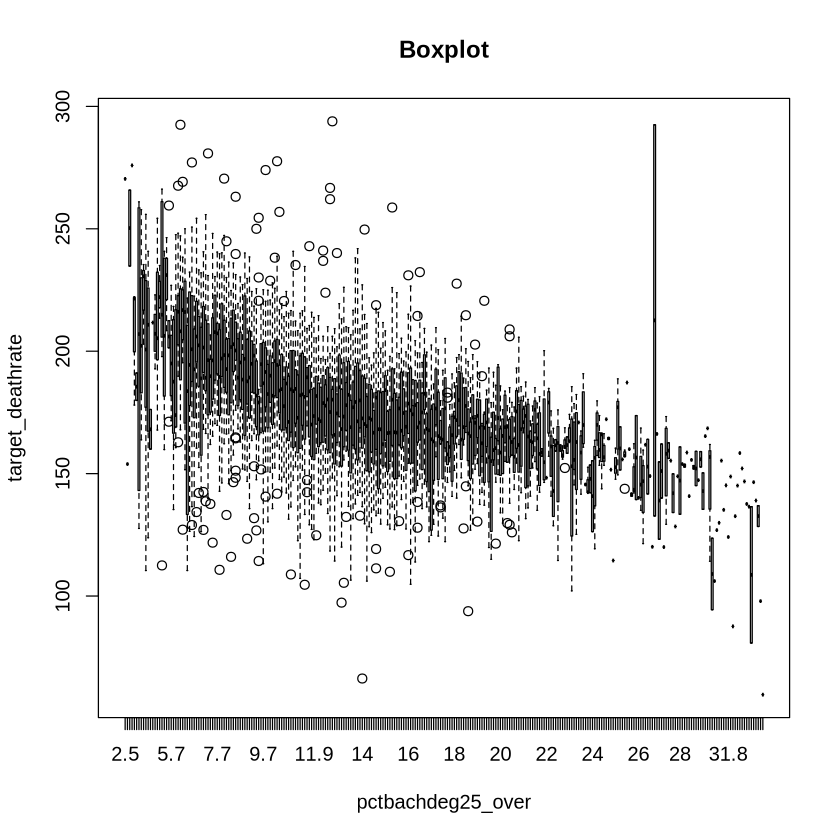

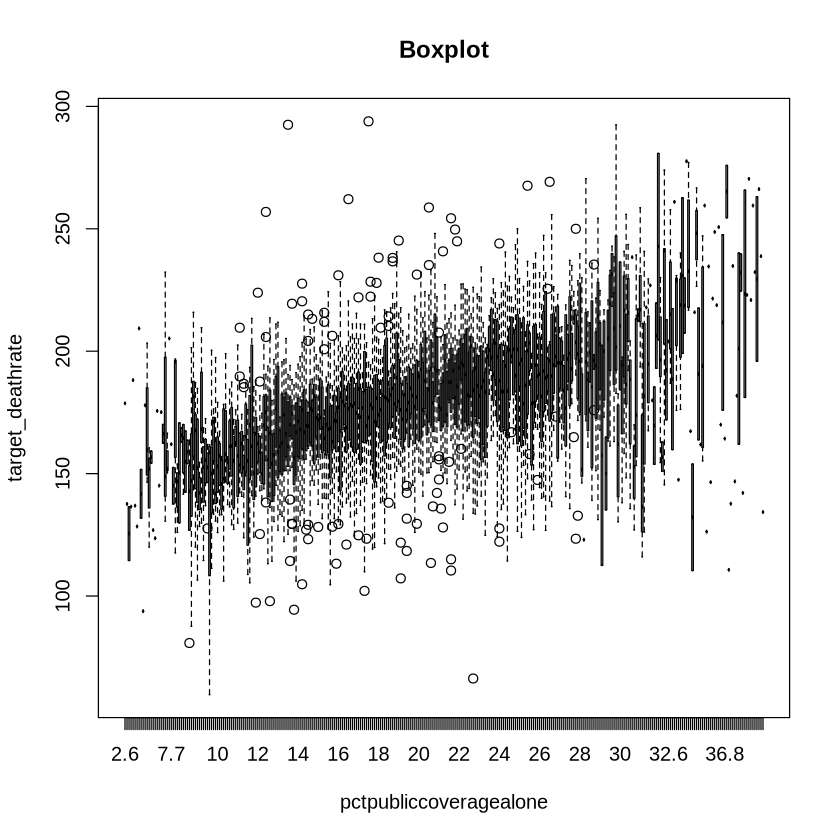

In [103]:
a <- boxplot(sub_data$target_deathrate ~ sub_data$pctbachdeg25_over, main = "Boxplot", xlab = "pctbachdeg25_over", ylab = "target_deathrate")
b <- boxplot(sub_data$target_deathrate ~ sub_data$pctpubliccoveragealone, main = "Boxplot", xlab = "pctpubliccoveragealone", ylab = "target_deathrate")

Aqui volvemos a apreciar la tendencia de las variables y nuevamente todos los posibles outliers que se alejan de esta tendencia. Un caso muy claro de esto lo vemos en el primer gráfico alrededor del valor 27 de la variable pctbachdeg25_over, donde vemos un pico considerable de muertes.

Ahora mostrare nuevamente la correlación con la variable objetivo pero esta vez solo de las dos variables que usaré para los modelos.

In [99]:
new_data <- data[, c("target_deathrate", "pctbachdeg25_over", "pctpubliccoveragealone")]
correlation_matrix <- cor(new_data, new_data$target_deathrate)
correlation_matrix

target_deathrate,1.0000000
pctbachdeg25_over,-0.4854773
pctpubliccoveragealone,0.4493576


Lo que estas correlaciones nos indican es que cuanto mas gente mayor a 25 años tiene un grado de formación igual o superior a licenciatura, menor cantidad de muertos hay. Esto es cuanto menos curioso, ya que a priori, estas dos variables no deberían guardar una relación de causalidad, sin embargo se trata de la variable con mayor correlación con la cantidad de muertes. Esto podría deberse a que cuanto mayor es el nivel de educación, mas dinero generan, y mejor sanidad privada pueden contratar, resultando en una cantidad menor de muertes.

Con la segunda variable lo que vemos es que cuanto mayor es la cantidad de residentes del condado solo con cobertura de salud proporcionada por el gobierno, mayor es la tasa de muertes del condado. Esto podría tener cierta relación con lo mencionado anteriormente, ya que la sanidad publica en Estados Unidos es bastante precaria y debido a eso, cuanta mas gente del condado disponga solo de este tipo de sanidad, mas tasa de mortalidad encontramos en el condado en questión.

2. Desarrollo del mejor modelo
- generad un modelo de regresión lineal simple para cada una de las variables escogidas
- ¿qué modelo ajusta mejor?
- validad los diferentes supuestos que deben cumplir comentados en clase (¿hay alguna variable que no cumpla el criterio de homocedasticidad? ¿has detectado outliers?)
- escoge un modelo para su validación y justifica por qué?

Antes de nada voy a recoger información sobre las correlaciones entre las variables.

In [105]:
cor.test(new_data$target_deathrate , new_data$pctbachdeg25_over)
cor.test(new_data$target_deathrate , new_data$pctpubliccoveragealone)


	Pearson's product-moment correlation

data:  new_data$target_deathrate and new_data$pctbachdeg25_over
t = -30.643, df = 3045, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.5121576 -0.4578610
sample estimates:
       cor 
-0.4854773 



	Pearson's product-moment correlation

data:  new_data$target_deathrate and new_data$pctpubliccoveragealone
t = 27.756, df = 3045, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.4205588 0.4772517
sample estimates:
      cor 
0.4493576 


Dado que el valor p-value en ambos casos es menor que 0.05 rechazamos H0 que supondria una correlación igual a 0. Tambien puedo apreciar los intervalos de confianza entre ambas correlaciones y podemos ver como no llega a ser una correlacion realmente significativa.

Ahora me dispongo a crear la división del dataset entre Train data y Test data.

In [111]:
set.seed(500) 

inTrain = createDataPartition(y = new_data$target_deathrate, p = 0.7, list = FALSE, times = 1)

data_train  = new_data[inTrain, ]
data_test = new_data[-inTrain, ]

Una vez hecho esto es momento de ajustar y obtener un resumen del primer modelo.

In [113]:
modelo1 = lm(target_deathrate ~ pctbachdeg25_over , data = data_train) # Entrenamos el modelo
summary(modelo1)


Call:
lm(formula = target_deathrate ~ pctbachdeg25_over, data = data_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-110.626  -14.350    1.143   14.607  164.696 

Coefficients:
                   Estimate Std. Error t value Pr(>|t|)    
(Intercept)       211.80688    1.35597  156.20   <2e-16 ***
pctbachdeg25_over  -2.49148    0.09372  -26.58   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 23.99 on 2133 degrees of freedom
Multiple R-squared:  0.2489,	Adjusted R-squared:  0.2485 
F-statistic: 706.7 on 1 and 2133 DF,  p-value: < 2.2e-16


Este resumen nos indica los coeficientes del modelo, los cuales nos dicen que en el punto X = 0, el deathrate sera de 211, y que por cada incremento de X, la tasa bajará 2.5 aproximadamente. Tambien muestra el R-squared que nos indica que el 24% de la variación disponible en el conjunto de datos en la variable target_deathrate se explica por este modelo de regresión lineal simple. Debe decirse que esto es un valor muy bajo para este coeficiente, lo cual derivará en un valor de error significantemente alto.

In [115]:
resumen_modelo = summary(modelo1)
resumen_modelo$r.squared
resumen_modelo$sigma #Residual standard error
attributes(modelo1)
modelo1$coefficients

[1] 0.2488724

[1] 23.98905

$names
 [1] "coefficients"  "residuals"     "effects"       "rank"         
 [5] "fitted.values" "assign"        "qr"            "df.residual"  
 [9] "xlevels"       "call"          "terms"         "model"        

$class
[1] "lm"

(Intercept) pctbachdeg25_over 
       211.806880         -2.491481

Aqui podemos ver lo mencionado anteriormente de nuevo, ahora voy a analizar si el modelo cumple con los supuestos de la regresión.


	Shapiro-Wilk normality test

data:  modelo1$residuals
W = 0.98518, p-value = 4.325e-14


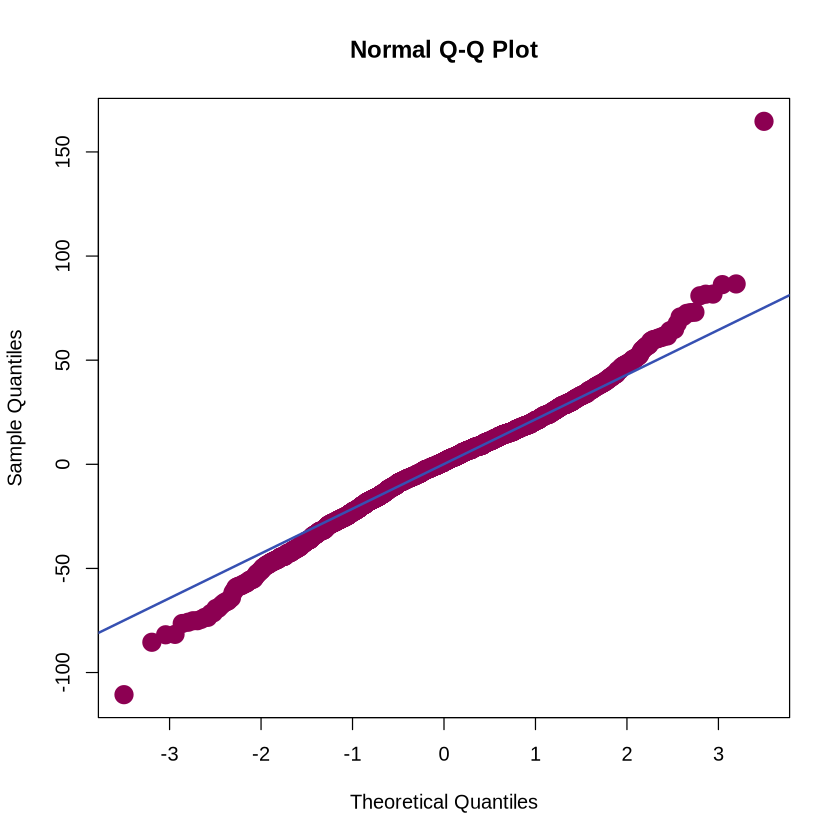

In [121]:
#### Normalidad
qqnorm(modelo1$residuals,pch =19,col ="#8c0052", cex=2)
qqline(modelo1$residuals , col = "#3650b2", lwd = 2 )  

shapiro.test(modelo1$residuals)

Observando el grafico podemos observar como los errores parecen distribuirse siguiendo una normal, sin embargo, según el p-value obtenido, eso no es así ya que p < 0.05. Esto posiblemente se deba al hecho de que este modelo traté con un gran número de datos y eso generé cierto ruido en este, así que applicando el teorema del límite central y fijándome en el grafico, aceptaré la hipótesis nula, es decir, los errores se distribuyen normalmente, pese a lo observado con el p-value.


	studentized Breusch-Pagan test

data:  modelo1
BP = 44.406, df = 1, p-value = 2.668e-11


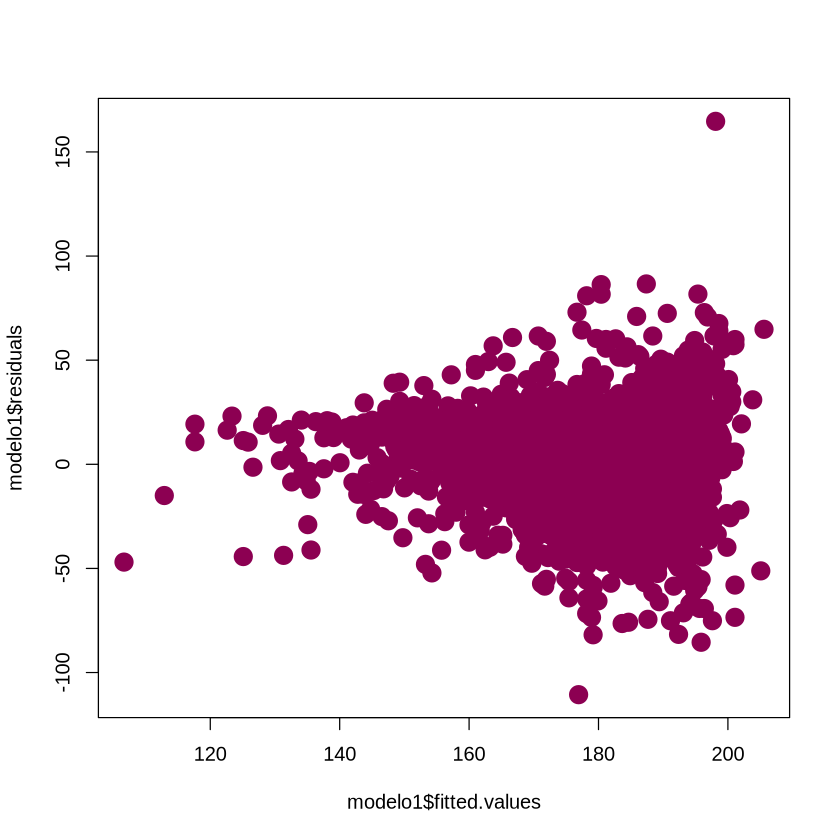

In [123]:
#### Homocedasticidad
plot(modelo1$fitted.values , modelo1$residuals , pch =19,col ="#8c0052", cex=2 )

bptest(modelo1)

Dado que el valor p < 0.05, por lo tanto, rechazo la hipótesis nula, es decir, los errores no tienen varianza constante.


	Durbin-Watson test

data:  modelo1
DW = 1.5915, p-value < 2.2e-16
alternative hypothesis: true autocorrelation is not 0


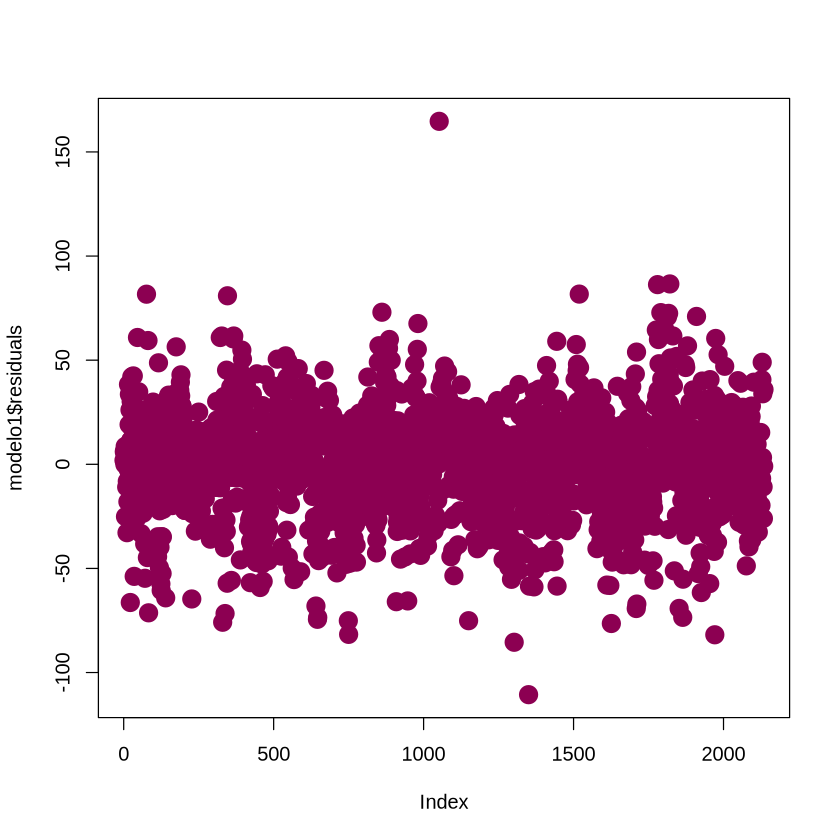

In [125]:
#### Autocorrelación
plot(modelo1$residuals, pch =19,col ="#8c0052", cex=2)

dwtest(modelo1,  alternative = c("two.sided"))

Dado que el valor p < 0,05 rechazo la hipótesis nula, es decir, los errores están correlacionados.


In [152]:
#### Media de errores
mean(modelo1$residuals)

[1] 5.465053e-16

El resultado anterior muestra que la media de errores es aproximadamente cero, por lo tanto se cumple este supesto junto con el de normalidad tal y como he comentado antes pero no se cumplen ni el supuesto de Homocedasticidad ni el de Autocorrelación.


.rownames,target_deathrate,pctbachdeg25_over,.fitted,.resid,.hat,.sigma,.cooksd,.std.resid
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1066,80.8,34.8,125.1034,-44.30336,0.007480506,23.97533,0.01295001,-1.853763
1094,59.7,42.2,106.6664,-46.96640,0.013158068,23.97281,0.02589498,-1.970836
1490,362.8,5.5,198.1037,164.69626,0.001412710,23.72769,0.03338816,6.870333


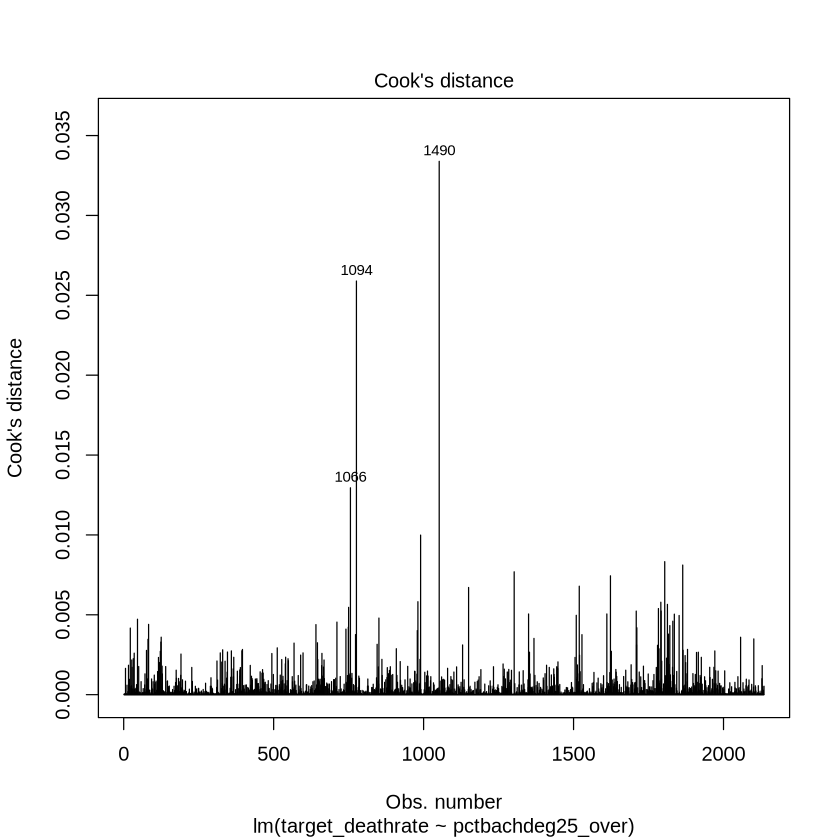

In [145]:
#### Detección de outliers

plot(modelo1 , 4)

model_dm = augment(modelo1)


outliers <- model_dm[model_dm$.cooksd > 0.01,]

outliers

Aqui podemos ver como tenemos 3 principales outliers, sin embargo es así porque fijo un umbral de cooksd mayor a 0.01 ya que al usar el valor usual de 4/N, un 80% de las muestras resultaban ser outliers.

Ahora trabajaré con el siguiente modelo.

In [146]:
#### Modelo 2
set.seed(500) 

inTrain = createDataPartition(y = new_data$target_deathrate, p = 0.7, list = FALSE, times = 1)

data_train  = new_data[inTrain, ]
data_test = new_data[-inTrain, ]

modelo2 = lm(target_deathrate ~ pctpubliccoveragealone, data = data_train) # Entrenamos el modelo
summary(modelo2)

resumen_modelo2 = summary(modelo2)
resumen_modelo2$r.squared
resumen_modelo2$sigma #Residual standard error
attributes(modelo2)
modelo2$coefficients


Call:
lm(formula = target_deathrate ~ pctpubliccoveragealone, data = data_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-119.055  -13.278    1.244   14.709  177.844 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)            140.14975    1.76391   79.45   <2e-16 ***
pctpubliccoveragealone   1.99141    0.08723   22.83   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 24.81 on 2133 degrees of freedom
Multiple R-squared:  0.1964,	Adjusted R-squared:  0.196 
F-statistic: 521.2 on 1 and 2133 DF,  p-value: < 2.2e-16


[1] 0.1963542

[1] 24.81352

$names
 [1] "coefficients"  "residuals"     "effects"       "rank"         
 [5] "fitted.values" "assign"        "qr"            "df.residual"  
 [9] "xlevels"       "call"          "terms"         "model"        

$class
[1] "lm"

(Intercept) pctpubliccoveragealone 
            140.149750               1.991408

Podemos apreciar como el r-squared de este modelo es de 0.196 siendo incluso peor que el anterior.

[1] -6.39558e-16


	Shapiro-Wilk normality test

data:  modelo2$residuals
W = 0.98147, p-value = 4.834e-16


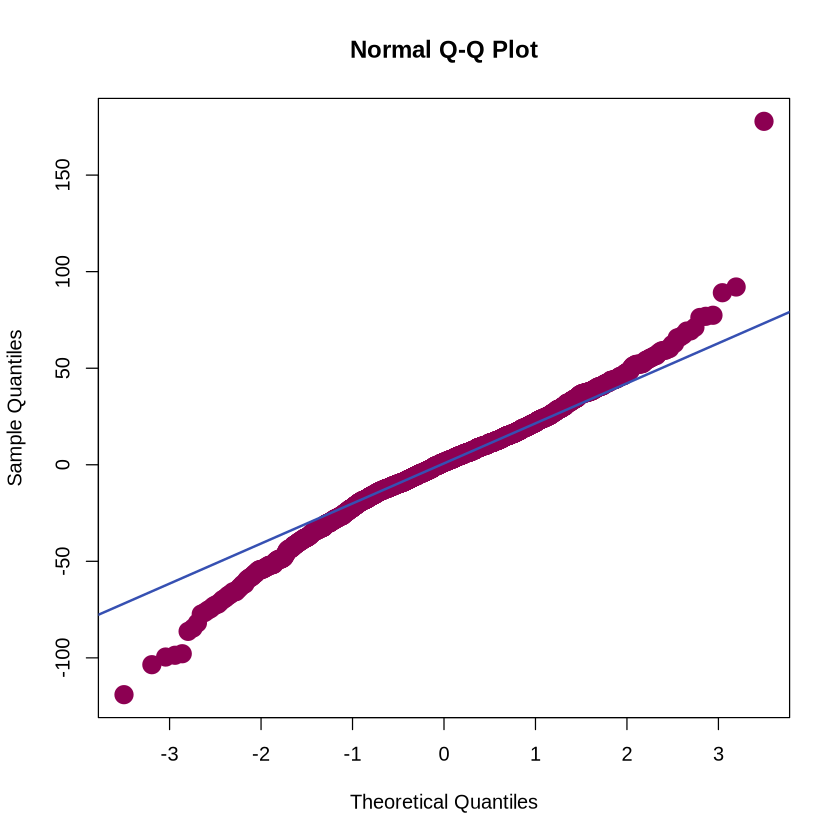


	studentized Breusch-Pagan test

data:  modelo2
BP = 55.511, df = 1, p-value = 9.293e-14


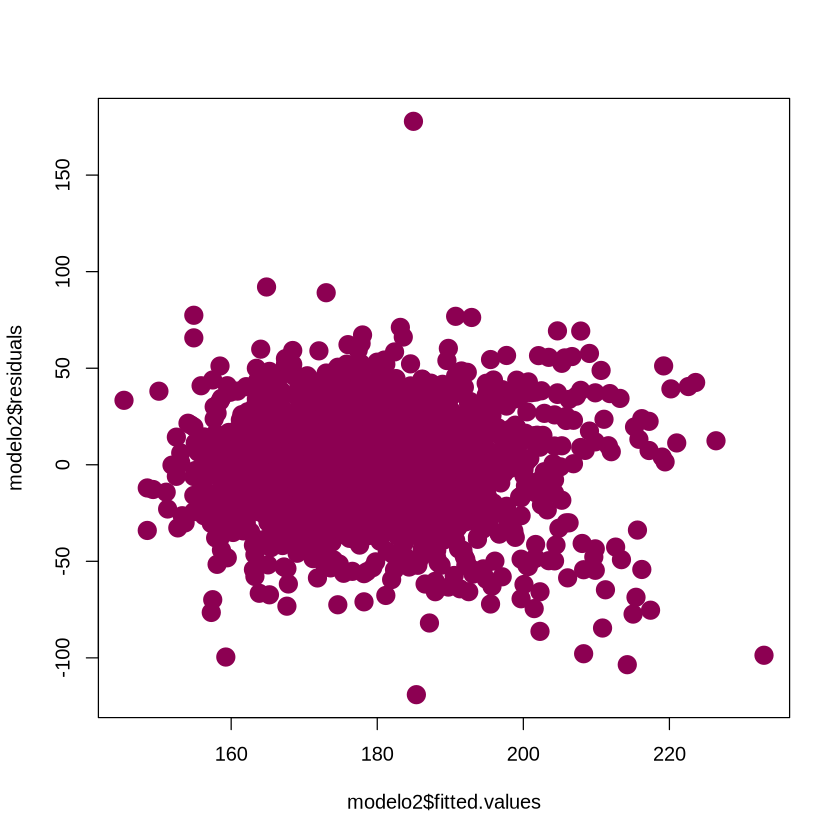


	Durbin-Watson test

data:  modelo2
DW = 1.4831, p-value < 2.2e-16
alternative hypothesis: true autocorrelation is not 0


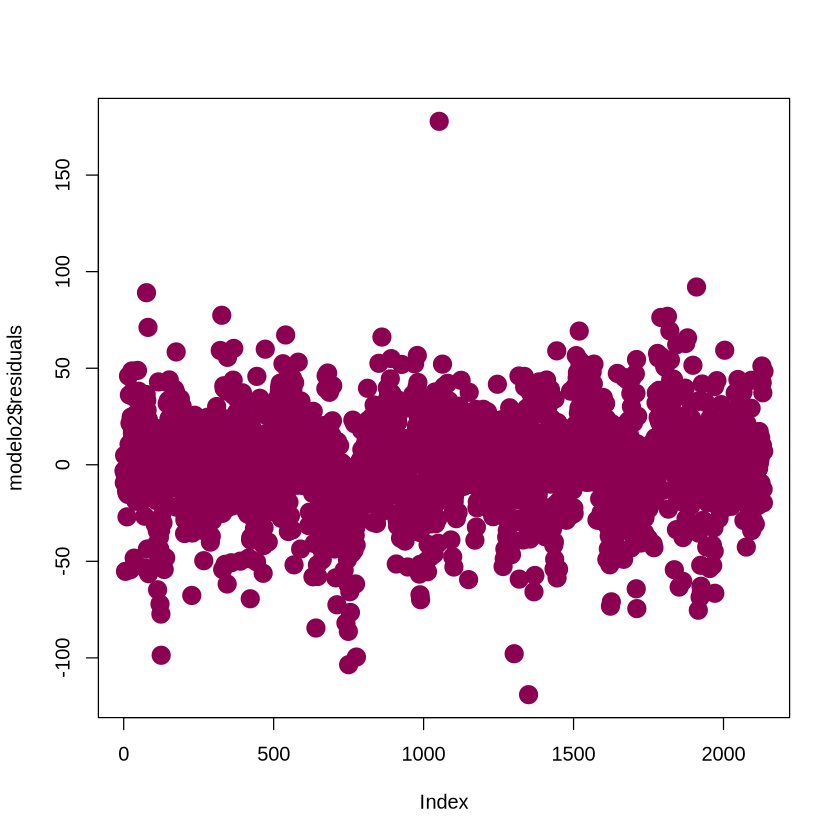

In [156]:
#### Media de errores
mean(modelo2$residuals)

#### Normalidad
qqnorm(modelo2$residuals,pch =19,col ="#8c0052", cex=2)
qqline(modelo2$residuals , col = "#3650b2", lwd = 2 )  

shapiro.test(modelo2$residuals)

#### Homocedasticidad --> Se rechaza
plot(modelo2$fitted.values , modelo2$residuals , pch =19,col ="#8c0052", cex=2 )

bptest(modelo2)

#### Autocorrelación
plot(modelo2$residuals, pch =19,col ="#8c0052", cex=2)

dwtest(modelo2,  alternative = c("two.sided"))

A raiz de la información en esta última celda podemos determinar que este modelo no sigue los principios de Homocedasticidad  ni Autocorrelación, y con una normalidad questionable aunque la aceptaré.

.rownames,target_deathrate,pctpubliccoveragealone,.fitted,.resid,.hat,.sigma,.cooksd,.std.resid
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
163,146.5,35.7,211.2430,-64.74302,0.0038082486,24.77955,0.01306226,-2.614165
176,137.7,37.6,215.0267,-77.32670,0.0046248982,24.76251,0.02266630,-3.123544
177,134.3,46.6,232.9494,-98.64937,0.0097056396,24.72631,0.07821271,-3.995064
194,162.0,38.2,216.2215,-54.22154,0.0049013259,24.79141,0.01181730,-2.190536
472,232.3,7.4,154.8862,77.41383,0.0022070598,24.76252,0.01078856,3.123273
913,126.3,35.5,210.8447,-84.54474,0.0037274761,24.75146,0.02179841,-3.413572
1058,116.0,31.2,202.2817,-86.28168,0.0022300124,24.74874,0.01354181,-3.481088
1059,110.7,37.2,214.2301,-103.53013,0.0044455567,24.71740,0.03904117,-4.181632
1094,59.7,9.6,159.2673,-99.56727,0.0016218901,24.72534,0.01309959,-4.015879


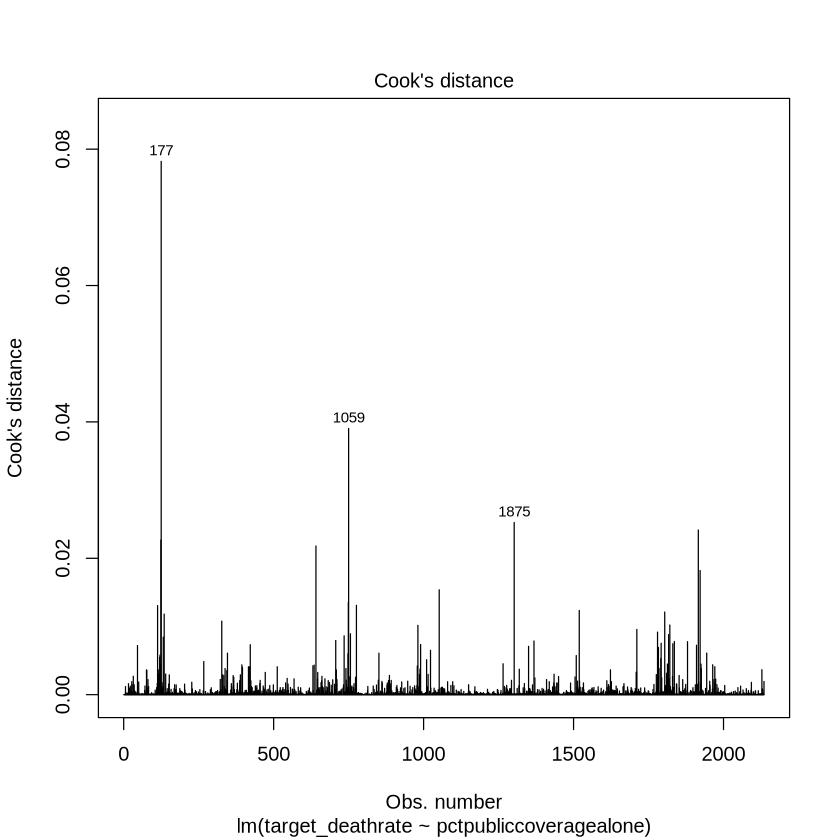

In [154]:
#### Detección de outliers

plot(modelo2 , 4)

model_dm = augment(modelo2)


outliers <- model_dm[model_dm$.cooksd > 0.01,]

outliers

Al igual que con el anterior modelo uso un umbral de 0.01 ya que usando 4/N resultaría en una gran parte de la información siendo considerada como outliers, sin embargo este modelo tiene incluso mas outliers que el anterior.

En base a la comparación entre ambos modelos y la superioridad en r-squared del primero respecto al segundo me quedaré con el modelo basado en la variable pctbachdeg25_over.

3. Validación mediante el conjunto de Test
- generad un gráfico de relación dato observado vs predicción
- comentad los valores R^2, RMSE, MAE
- te quedarías con este modelo?

R2,RMSE,MAE
<dbl>,<dbl>,<dbl>
0.2052558,24.90106,18.54153


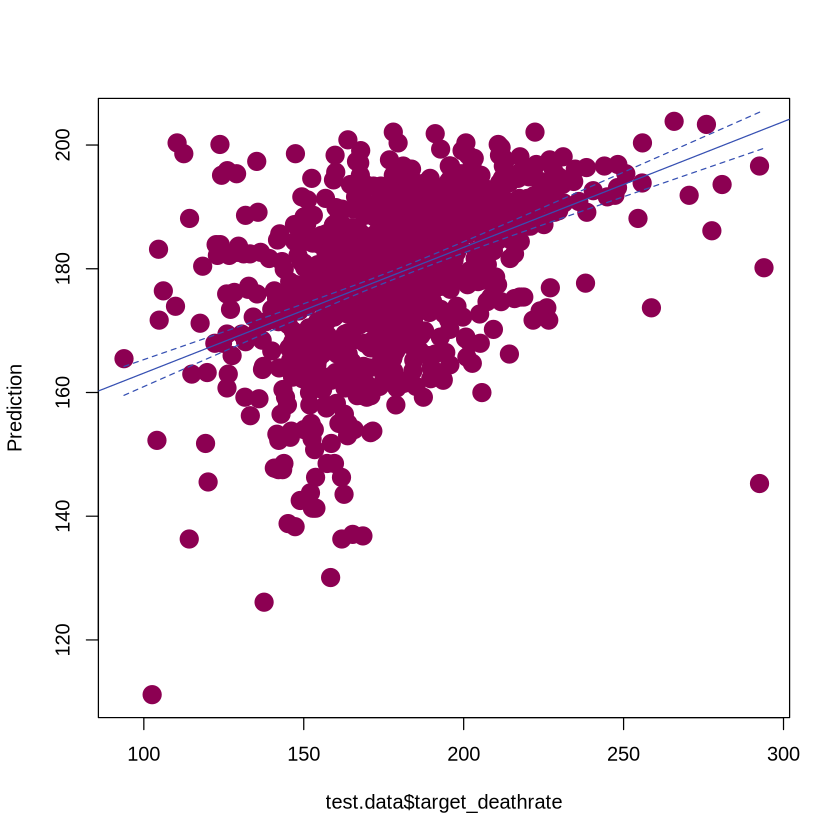

In [150]:
# Making prediction
prediction = predict(modelo1, data_test)

### Visualization
plot(data_test$target_deathrate, prediction, xlab="test.data$target_deathrate", ylab="Prediction", pch =19,col ="#8c0052", cex=2)

#add fitted regression line
lm.out = lm(prediction ~ target_deathrate, data = data_test)
newx = seq(min(data_test$target_deathrate),max(data_test$target_deathrate),by = 0.05)
conf_interval = predict(lm.out, newdata=data.frame(target_deathrate=newx), interval="confidence", level = 0.95)
abline(lm.out, col = "#3650b2")

#add conf_interval lines
lines(newx, conf_interval[,2], col="#3650b2", lty=2)
lines(newx, conf_interval[,3], col="#3650b2", lty=2)

# Statistical Measure
data.frame( R2 = R2(prediction, data_test$target_deathrate),
            RMSE = RMSE(prediction, data_test$target_deathrate),
            MAE = MAE(prediction, data_test$target_deathrate))

R2: se obtiene un 0.205, esto significa que tan solo poco mas del 20% de la variabilidad de la variable objetivo target_deathrate es explicada por el modelo.2.98

RMSE - Error Cuadrático Medio: en promedio, las predicciones difieren alrededor de 24.90 unidades de la variable target_deathrate.

MAE - Error Absoluto Medio: este indicador es la media de las diferencias absolutas entre las predicciones y los valores reales. Inferior al RMSE, la diferencia media entre variable respuesta y predicción es de 18.5.

Después de observar el grafico de datos observados vs predicción, podemos ver como los valores se alejan mucho de lo que seria una tendencia aceptable en cuanto a la variable objetivo, también podemos ver como solo un 20% de la variabilidad es explicada con nuestro modelo dejando un RMSE y un MAE realmente grandes resultando en una gran desviación por parte del valor predecido respecto al observado. Así que tras considerar todo esto y las previas observaciones de la variable explicativa que ya nos acontecia con una correlación que no era significadamente alta que el modelo dejaría mucho que desear, yo no me quedaría con este modelo para predecir la variable objetivo. Pero no porque la variable explicativa no sea la correcta, más bien, de las variables del dataset esta es la que genera el mejor modelo, sinó porque hay muchas muestras, muchas variables, y correlaciones que no son lo suficientemente fuertes para realizar un modelo de regresión lineal simple y en este caso lo mejor seria tratar de realizar un modelo de regresión multivariante que seguramente podría acabar explicando mucho mejor la variable objetivo.

Entrega: fichero Jupyter Notebook con MD004NombreApellidosAC04.ipynb y MD004NombreApellidosAC04.pdf

Plazo: 13 de Diciembre a las 19h